Импортируем нужные библиотеки, также в среду Anaconda необходимо установить две библиотеки:
 - conda install geopandas
 - conda install descartes
 - import pip
 - pip.main(['install', 'xgboost'])

In [1348]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RepeatedKFold
from sklearn import metrics
import pip
pip.main(['install', 'xgboost'])
import xgboost as xgb
from sklearn.cluster import KMeans
from sklearn.preprocessing import PolynomialFeatures
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.svm import SVR

Ссылка на наборы данных:
    https://www.ecdc.europa.eu/en/publications-data/data-daily-new-cases-covid-19-eueea-country
    https://www.ecdc.europa.eu/en/publications-data/data-covid-19-vaccination-eu-eea
    https://www.ecdc.europa.eu/en/publications-data/download-data-hospital-and-icu-admission-rates-and-current-occupancy-covid-19
    https://www.ecdc.europa.eu/en/publications-data/download-data-response-measures-covid-19

Исходный набор данных состоял из пяти файлов - карты европейских государств в формате geojson, ежедневных данных о количестве заболевших, смертей в каждой из стран за период январь 2020 - апрель 2022, ежедневных данных о количестве человек, получивших первую прививку, вторую прививку и дополнительную прививку, данных о количестве проведенных тестов, а также ограничительных мерах, принятых в стране в месяц.
Данные подверглись обработке - количество заболевших, смертей и привитых людей, протестированных суммированы посуточно для каждой страны. Из файла с географическими данными удалены страны, данные которых о смертности и вакцинации отсутсвуют. Дата каждого наблюдения преобразована к целому числу - месяцу с начала наблюдений (1 - январь 2020, 2 - февраль 2020 и т.д.)

Импортируем датасет с картой европейских стран в формате geojson:

In [1349]:
europe_map = gpd.read_file('europe.geojson')

В данных есть столбец ISO3, по которому мы будем соединять данные карты с данными по COVID-19

In [1350]:
europe_map.head()

,ISO3,NAME,AREA,LON,LAT,geometry
0,BGR,Болгария,11063,25.231,42.761,"POLYGON ((27.87917 42.84110, 27.89500 42.80250..."
1,CYP,Кипр,924,33.219,35.043,"POLYGON ((33.65262 35.35410, 33.71305 35.38194..."
2,DNK,Дания,4243,9.264,56.058,"MULTIPOLYGON (((11.51389 54.82972, 11.56444 54..."
3,IRL,Ирландия,6889,-8.152,53.177,"MULTIPOLYGON (((-9.65639 53.22222, -9.66333 53..."
4,EST,Эстония,4239,25.793,58.674,"MULTIPOLYGON (((23.99083 58.10000, 23.97805 58..."


Импортируем датасет с данными по COVID-19:

In [1351]:
covid_df = pd.read_csv('COVID19_vaccine_dataset.csv', sep=';')
covid_df.head()

,Month,Cases,Death,ISO2,ISO3,Pop,TestsDone,TestingRate,PositivityRate,AdaptationOfWorkplace,...,SIN_AD,SPU_FD,SPU_SD,SPU_AD,UNK_FD,UNK_SD,UNK_AD,Hosp,ICU,MeasuresSum
0,3,10478,174,AT,AUT,8901064,0.0,0.000000,0.000000,0,...,0,0,0,0,0,0,0,0,0,19
1,3,16977,1411,BE,BEL,11522440,58619.0,101.363984,17.707735,0,...,0,0,0,0,0,0,0,28957,6171,14
2,3,412,8,BG,BGR,6951482,0.0,0.000000,0.000000,0,...,0,0,0,0,0,0,0,0,0,18
3,3,147,2,CY,CYP,888005,689.0,19.224180,19.576350,0,...,0,0,0,0,0,0,0,21,6,17
4,3,3316,35,CZ,CZE,10693939,44082.0,82.382580,5.204280,1,...,0,0,0,0,0,0,0,1856,340,21


Объединяем выборку полей для визуализации с картой по полю ISO3 и посмотрим на результат:

In [1352]:
europe_covid_df = pd.merge(covid_df[['Cases', 'Death', 'ISO3', 'Pop', 'TestsDone', 'TestingRate', 'PositivityRate', 'FirstDose', 'SecondDose', 'AdditionalDose']], europe_map, how="left", on=["ISO3", "ISO3"])
europe_covid_df.head()

,Cases,Death,ISO3,Pop,TestsDone,TestingRate,PositivityRate,FirstDose,SecondDose,AdditionalDose,NAME,AREA,LON,LAT,geometry
0,10478,174,AUT,8901064,0.0,0.000000,0.000000,0,0,0,Австрия,8245,14.912,47.683,"POLYGON ((13.83361 48.77361, 13.85806 48.77055..."
1,16977,1411,BEL,11522440,58619.0,101.363984,17.707735,0,0,0,Бельгия,0,4.664,50.643,"POLYGON ((4.30237 51.26318, 4.30968 51.26203, ..."
2,412,8,BGR,6951482,0.0,0.000000,0.000000,0,0,0,Болгария,11063,25.231,42.761,"POLYGON ((27.87917 42.84110, 27.89500 42.80250..."
3,147,2,CYP,888005,689.0,19.224180,19.576350,0,0,0,Кипр,924,33.219,35.043,"POLYGON ((33.65262 35.35410, 33.71305 35.38194..."
4,3316,35,CZE,10693939,44082.0,82.382580,5.204280,0,0,0,Чехия,7727,15.338,49.743,"POLYGON ((14.70028 48.58138, 14.65639 48.60750..."


Нарисуем карту исследуемых стран на основе данных о численности населения:

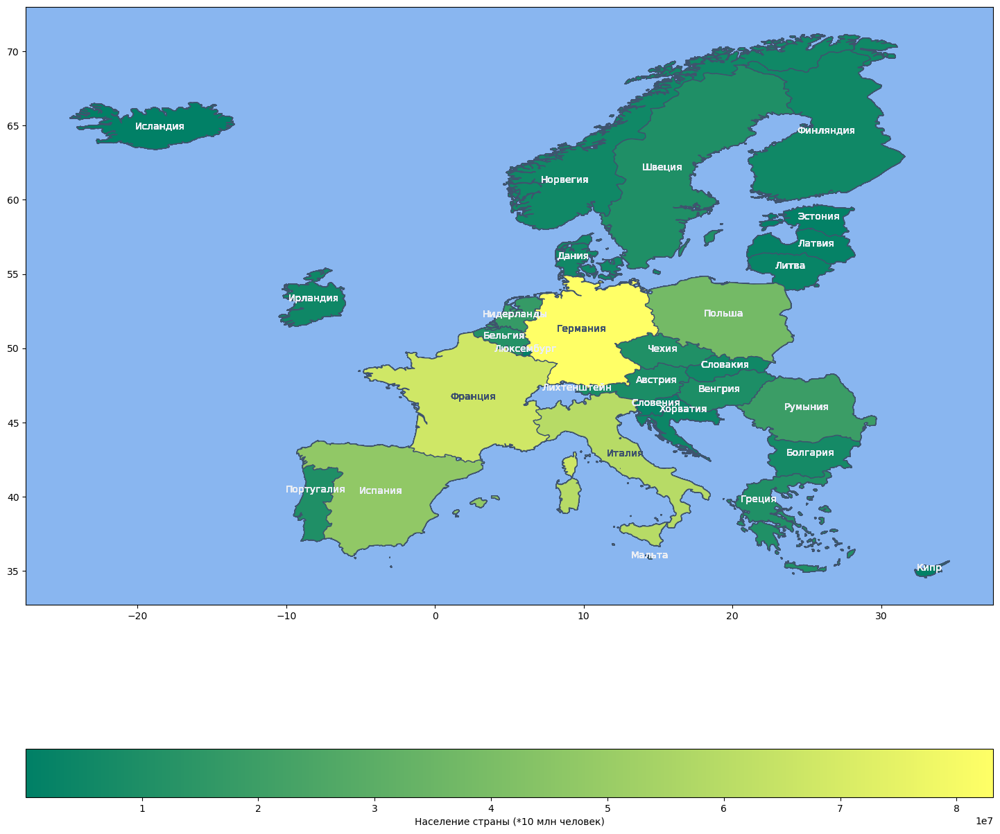

In [1353]:
europe_map_COVID = gpd.GeoDataFrame(europe_covid_df, geometry=europe_covid_df['geometry'])
edge_color = '#3f536e'
label_color = '#ebeff5'
sea_color = '#89b6f0'
fig, ax = plt.subplots(figsize = (18, 18))
ax.set_facecolor(sea_color)
europe_map_COVID.plot(ax=ax, edgecolor=edge_color, column='Pop', cmap='summer',
                      legend=True, legend_kwds={'label': "Население страны (*10 млн человек)", 'orientation': "horizontal"});
for idx, row in europe_map_COVID.iterrows():
    if row['Pop'] > 50000000:
        plt.annotate(text=row['NAME'], xy=(row['LON'],row['LAT']), horizontalalignment='center', color=edge_color)
    else:
        plt.annotate(text=row['NAME'], xy=(row['LON'],row['LAT']), horizontalalignment='center', color=label_color)

Анализ доли смертей к численности населения за период наблюдения (с января 2020 по апрель 2022 года):

In [1354]:
deaths_sum = europe_map_COVID.groupby('NAME').sum()['Death']
deaths_sum.name = 'sum_Deaths'
europe_map_COVID = europe_map_COVID.join(deaths_sum, on='NAME')
europe_map_COVID['Death_to_Pop'] = europe_map_COVID['sum_Deaths'] / europe_map_COVID['Pop']

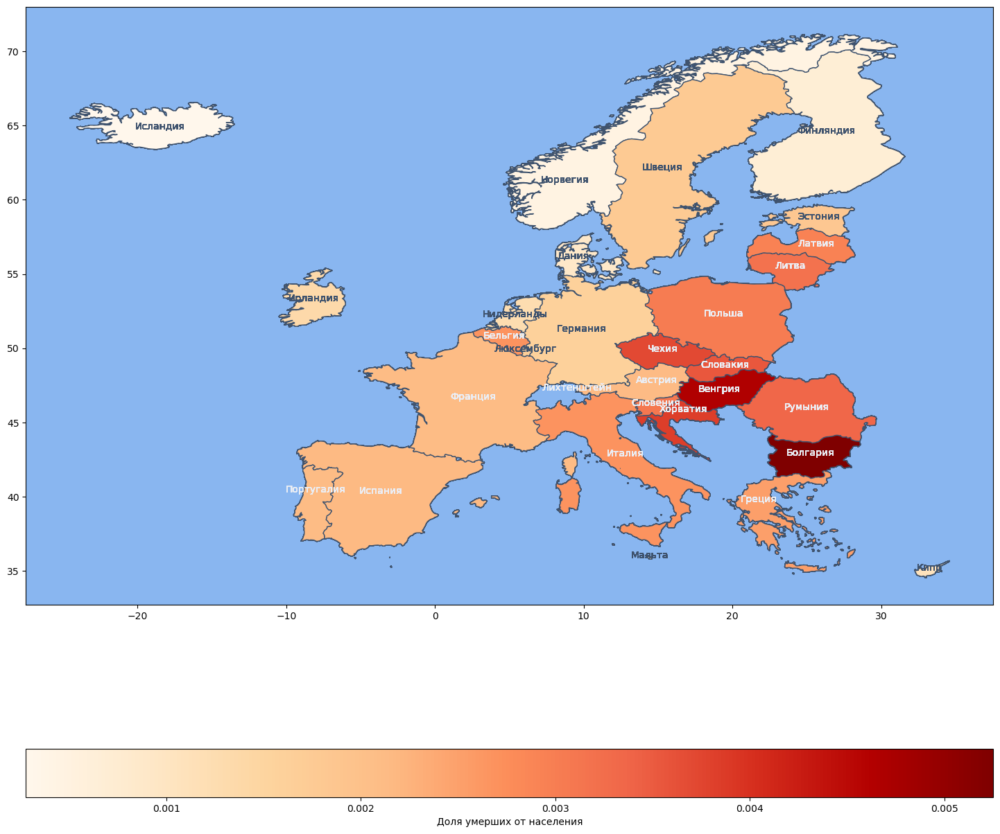

In [1355]:
fig, ax = plt.subplots(figsize = (18, 18))
ax.set_facecolor(sea_color)
europe_map_COVID.plot(ax=ax, edgecolor=edge_color, column='Death_to_Pop', cmap='OrRd',
                      legend=True, legend_kwds={'label': "Доля умерших от населения", 'orientation': "horizontal"});
for idx, row in europe_map_COVID.iterrows():
    if row['Death_to_Pop'] < 0.002:
        plt.annotate(text=row['NAME'], xy=(row['LON'],row['LAT']), horizontalalignment='center', color=edge_color)
    else:
        plt.annotate(text=row['NAME'], xy=(row['LON'],row['LAT']), horizontalalignment='center', color=label_color)

Анализ доли заболевших к численности населения за период наблюдения (с января 2020 по апрель 2022 года):

In [1356]:
cases_sum = europe_map_COVID.groupby('NAME').sum()['Cases']
cases_sum.name = 'sum_Cases'
europe_map_COVID = europe_map_COVID.join(cases_sum, on='NAME')
europe_map_COVID['Cases_to_Pop'] = europe_map_COVID['sum_Cases'] / europe_map_COVID['Pop']

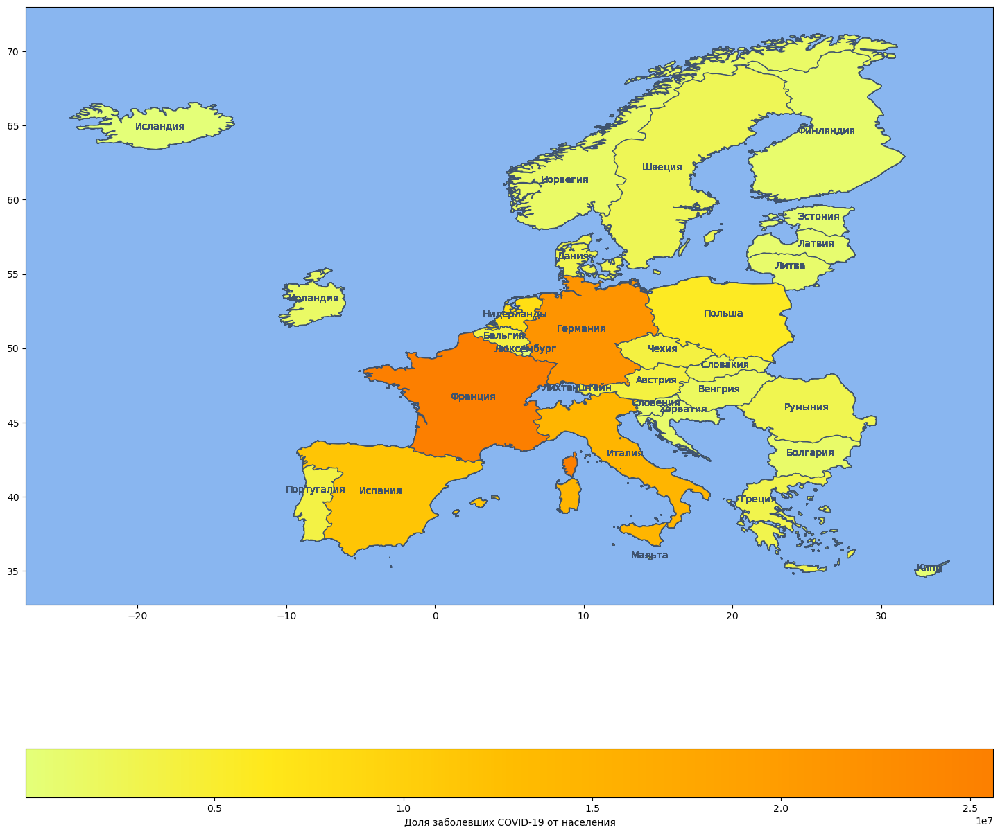

In [1357]:
fig, ax = plt.subplots(figsize = (18, 18))
ax.set_facecolor(sea_color)
europe_map_COVID.plot(ax=ax, edgecolor=edge_color, column='sum_Cases', cmap='Wistia',
                      legend=True, legend_kwds={'label': "Доля заболевших COVID-19 от населения", 'orientation': "horizontal"});
for idx, row in europe_map_COVID.iterrows():
    plt.annotate(text=row['NAME'], xy=(row['LON'],row['LAT']), horizontalalignment='center', color=edge_color)

Анализ доли вакцинированных к численности населения за период наблюдения (с января 2020 по апрель 2022 года):

In [1358]:
pd.set_option('display.max_rows', None)
vaccined_sum = europe_map_COVID.groupby('NAME').sum()['SecondDose']
vaccined_sum.name = 'sum_Vaccined'
europe_map_COVID = europe_map_COVID.join(vaccined_sum, on='NAME')

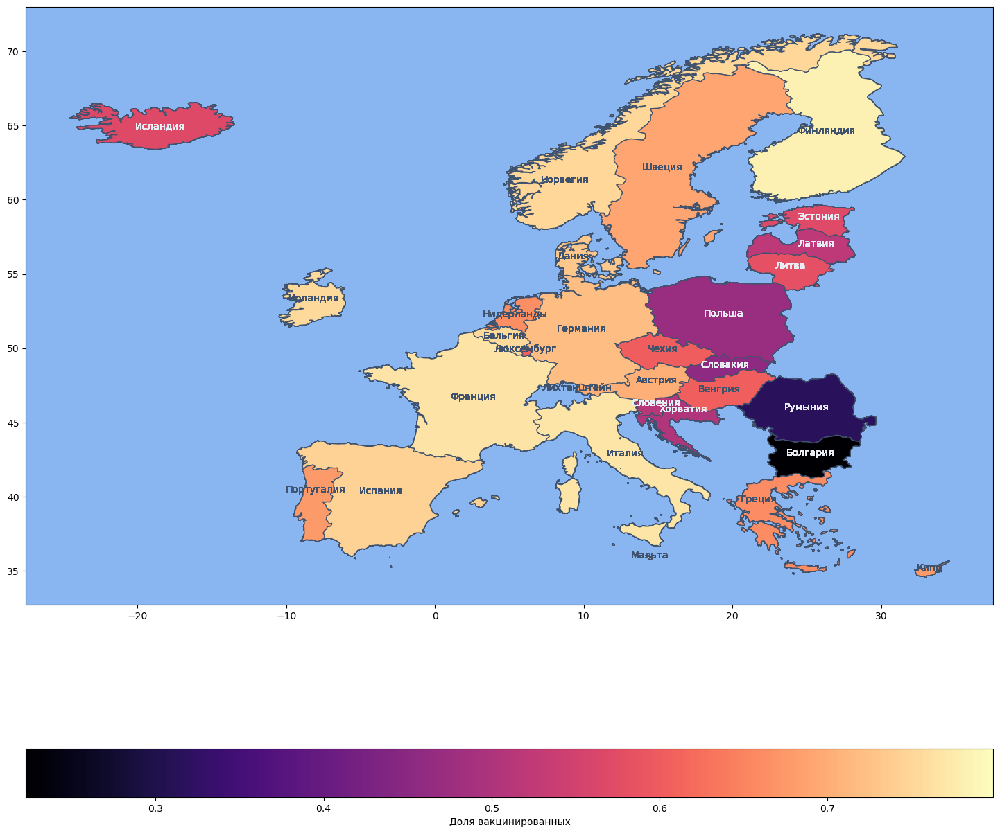

In [1359]:
europe_map_COVID['Vaccined_to_Population'] = europe_map_COVID['sum_Vaccined'] / europe_map_COVID['Pop']
fig, ax = plt.subplots(figsize = (18, 18))
ax.set_facecolor(sea_color)
europe_map_COVID.plot(ax=ax, edgecolor=edge_color, column='Vaccined_to_Population', cmap='magma',
                      legend=True, legend_kwds={'label': "Доля вакцинированных", 'orientation': "horizontal"});
for idx, row in europe_map_COVID.iterrows():
    if row['Vaccined_to_Population'] > 0.6:
        plt.annotate(text=row['NAME'], xy=(row['LON'],row['LAT']), horizontalalignment='center', color=edge_color)
    else:
        plt.annotate(text=row['NAME'], xy=(row['LON'],row['LAT']), horizontalalignment='center', color=label_color)

Анализ доли умерших к числу заболевших за период наблюдения (с января 2020 по апрель 2022 года): 

In [1360]:
europe_map_COVID['Cases_to_Deaths'] = europe_map_COVID['sum_Deaths'] / europe_map_COVID['sum_Cases']

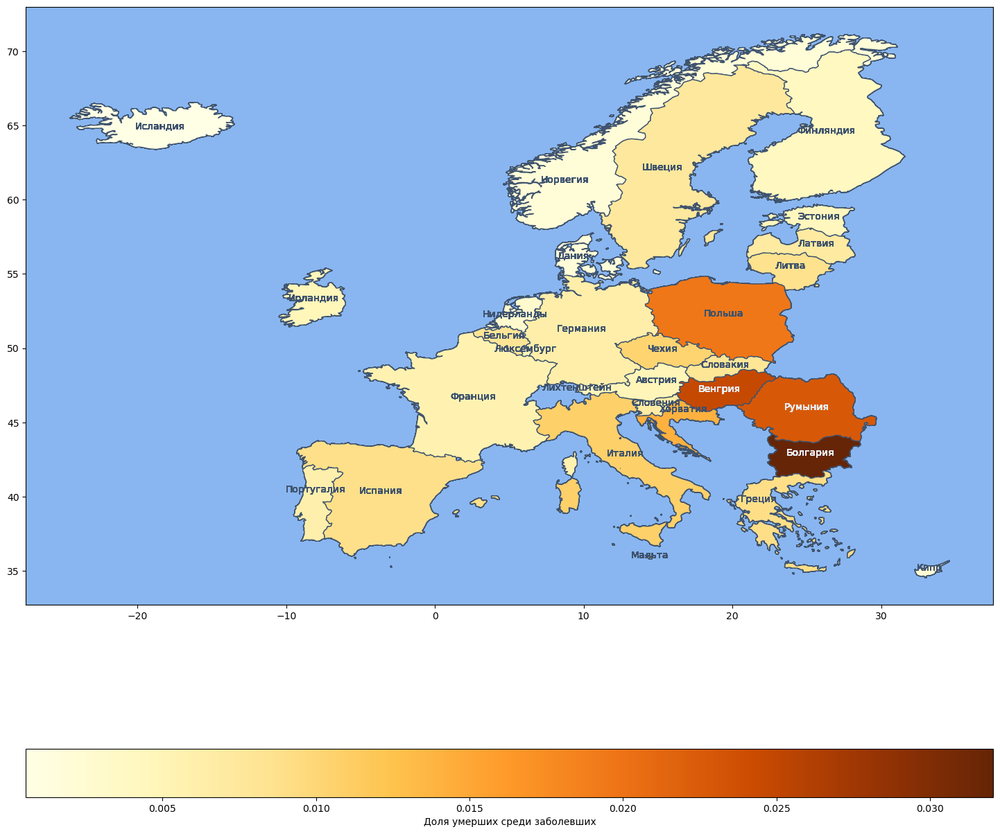

In [1361]:
fig, ax = plt.subplots(figsize = (18, 18))
ax.set_facecolor(sea_color)
europe_map_COVID.plot(ax=ax, edgecolor=edge_color, column='Cases_to_Deaths', cmap='YlOrBr',
                      legend=True, legend_kwds={'label': "Доля умерших среди заболевших", 'orientation': "horizontal"});
for idx, row in europe_map_COVID.iterrows():
    if row['Cases_to_Deaths'] < 0.020:
        plt.annotate(text=row['NAME'], xy=(row['LON'],row['LAT']), horizontalalignment='center', color=edge_color)
    else:
        plt.annotate(text=row['NAME'], xy=(row['LON'],row['LAT']), horizontalalignment='center', color=label_color)

Проведем анализ исследуемых данных:

In [1362]:
europe_covid_df = pd.read_csv('COVID19_vaccine_dataset.csv', sep=';')

In [1363]:
europe_covid_df.head()

,Month,Cases,Death,ISO2,ISO3,Pop,TestsDone,TestingRate,PositivityRate,AdaptationOfWorkplace,...,SIN_AD,SPU_FD,SPU_SD,SPU_AD,UNK_FD,UNK_SD,UNK_AD,Hosp,ICU,MeasuresSum
0,3,10478,174,AT,AUT,8901064,0.0,0.000000,0.000000,0,...,0,0,0,0,0,0,0,0,0,19
1,3,16977,1411,BE,BEL,11522440,58619.0,101.363984,17.707735,0,...,0,0,0,0,0,0,0,28957,6171,14
2,3,412,8,BG,BGR,6951482,0.0,0.000000,0.000000,0,...,0,0,0,0,0,0,0,0,0,18
3,3,147,2,CY,CYP,888005,689.0,19.224180,19.576350,0,...,0,0,0,0,0,0,0,21,6,17
4,3,3316,35,CZ,CZE,10693939,44082.0,82.382580,5.204280,1,...,0,0,0,0,0,0,0,1856,340,21


In [1364]:
europe_covid_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 750 entries, 0 to 749
Data columns (total 111 columns):
 #    Column                                       Non-Null Count  Dtype  
---   ------                                       --------------  -----  
 0    Month                                        750 non-null    int64  
 1    Cases                                        750 non-null    int64  
 2    Death                                        750 non-null    int64  
 3    ISO2                                         750 non-null    object 
 4    ISO3                                         750 non-null    object 
 5    Pop                                          750 non-null    int64  
 6    TestsDone                                    750 non-null    float64
 7    TestingRate                                  750 non-null    float64
 8    PositivityRate                               750 non-null    float64
 9    AdaptationOfWorkplace                        750 non-null    in

Пропусков в данных нет

Размерность набора данных:

In [1365]:
europe_covid_df.shape

(750, 111)

Числовые признаки представлены:

- Month - номер месяца с начала наблюдений (с января 2020 года)
- Cases - количество выявленных случаев заболевания COVID-19
- Death - количество выявленных смертей от заболевания COVID-19
- FirstDose - количество людей, получивших первую дозу вакцины (суммарно за все вакцины)
- SecondDose - количество людей, получивших вторую дозу вакцины (суммарно за все вакцины)
- AddDose - количество людей, получивших дополнительную дозу вакцины (суммарно за все вакцины)
- Pop - население страны (по данным на 2020 год)
- TestsDone - количество выполненных тестов на COVID-19
- TestingRate - доля проведенных тестов на каждые 100000 человек населения
- PositivityRate - доля положительных тестов
- Hosp - число госпитализированных
- ICU - число пациентов в реанимации
  
    Признаки AREA, LON, LAT в качсетве данных для анализа не будут использоваться

In [1366]:
europe_covid_df = pd.read_csv('COVID19_vaccine_dataset.csv', sep=';')
country_list = sorted(europe_covid_df.ISO3.unique())
print(f'Количество анализируемых стран: {len(country_list)}')
europe_covid_df = pd.merge(europe_covid_df, europe_map[['ISO3', 'NAME']], how='left', on=['ISO3', 'ISO3'])
europe_covid_df.head()

Количество анализируемых стран: 30


,Month,Cases,Death,ISO2,ISO3,Pop,TestsDone,TestingRate,PositivityRate,AdaptationOfWorkplace,...,SPU_FD,SPU_SD,SPU_AD,UNK_FD,UNK_SD,UNK_AD,Hosp,ICU,MeasuresSum,NAME
0,3,10478,174,AT,AUT,8901064,0.0,0.000000,0.000000,0,...,0,0,0,0,0,0,0,0,19,Австрия
1,3,16977,1411,BE,BEL,11522440,58619.0,101.363984,17.707735,0,...,0,0,0,0,0,0,28957,6171,14,Бельгия
2,3,412,8,BG,BGR,6951482,0.0,0.000000,0.000000,0,...,0,0,0,0,0,0,0,0,18,Болгария
3,3,147,2,CY,CYP,888005,689.0,19.224180,19.576350,0,...,0,0,0,0,0,0,21,6,17,Кипр
4,3,3316,35,CZ,CZE,10693939,44082.0,82.382580,5.204280,1,...,0,0,0,0,0,0,1856,340,21,Чехия


In [1367]:
def dataset_prepare_model(dt):
    if 'NAME' in dt.columns:
        return_model = dt[['NAME', 'ISO3', 'Cases', 'Death', 'Hosp', 'ICU', 'Pop', 'TestsDone', 
                            'FirstDose', 'SecondDose']]
    else:
        return_model = dt[['ISO3', 'Cases', 'Death', 'Hosp', 'ICU', 'Pop', 'TestsDone',
                            'FirstDose', 'SecondDose']]
    return_model['Vaccine_Mortality'] = 'W'
    return_model.loc[dt['ISO3'].isin(['FIN', 'EST', 'GRC', 'HRV', 
                                      'LTU', 'LVA', 'BGR', 'HUN', 
                                      'POL', 'ROU', 'SVK']), 'Vaccine_Mortality'] = 'E'
    print(return_model.head())
    return return_model

In [1449]:
europe_covid_df_model = europe_covid_df[['NAME', 'ISO3', 'Month', 'Cases', 'Death', 'Hosp', 'ICU', 'Pop', 
                                         'TestsDone', 'PositivityRate', 'FirstDose', 'SecondDose', 
                                         'AdditionalDose', 'MeasuresSum', 'TestingRate']]

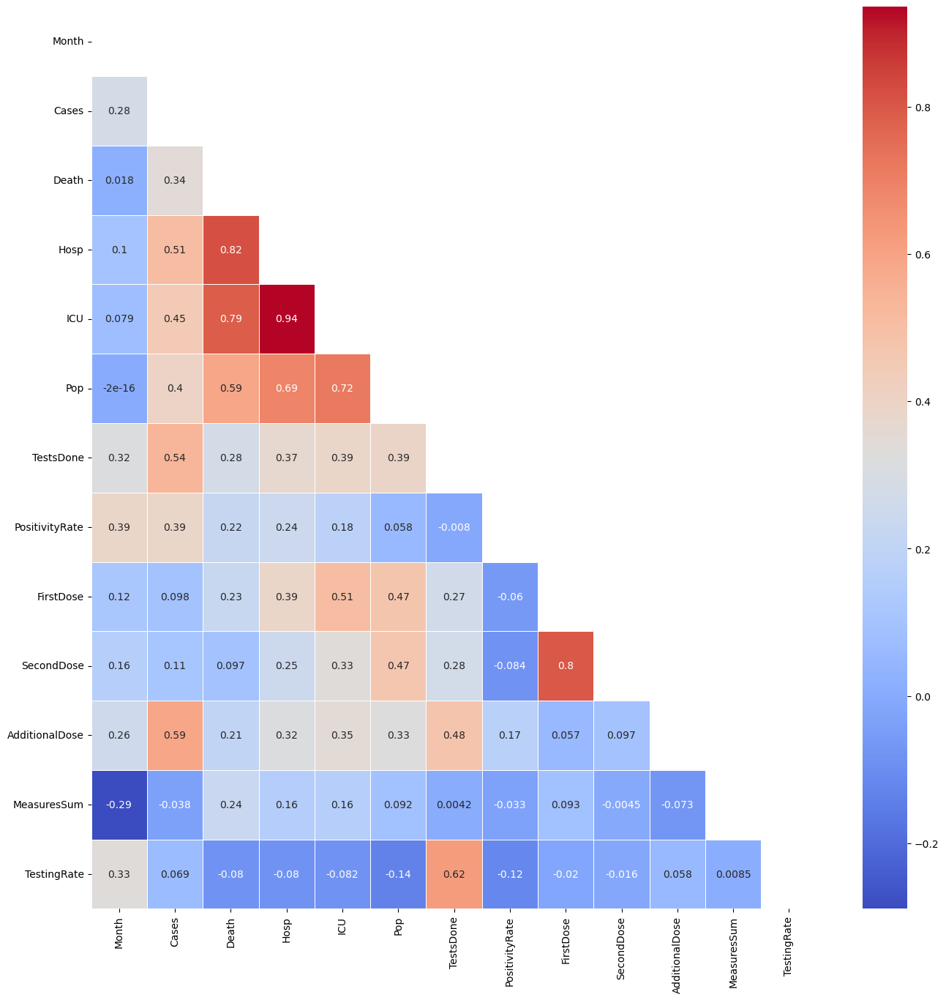

In [1409]:
fig, ax = plt.subplots(figsize=(16,16))
corr_matrix = europe_covid_df_model.corr()
sns.heatmap(corr_matrix, annot=True, mask=np.triu(europe_covid_df_model.corr()), cmap='coolwarm', linewidths=0.5, ax=ax) #
plt.show()

Из тепловой карты для всех стран видно, что сильно коррелированы признаки FirstDose и SecondDose, что свидетельствует о том, что бОльшая часть людей, получивших первую дозу вакцины, получили и вторую. Средняя степень корреляции между количеством смертей и численностью населения, довольно невысокая корреляция обусловлена разными мерами, принятыми для борьбы с COVID-19 в разных странах. Также сильно коррелированы число госпитализированных (Hosp) и число пациентов на реанимации (ICU), что говорит о том, что большая часть госпитализированных попали в реанимационные отделения. Наиболее коррелированы с целевой переменной (Death) - признаки число госпитализированных (Hosp) и число пациентов на реанимации (ICU), то есть подавляющее большинство из них умерли.

Проанализируем корреляцию различных немедицинских мер защиты:

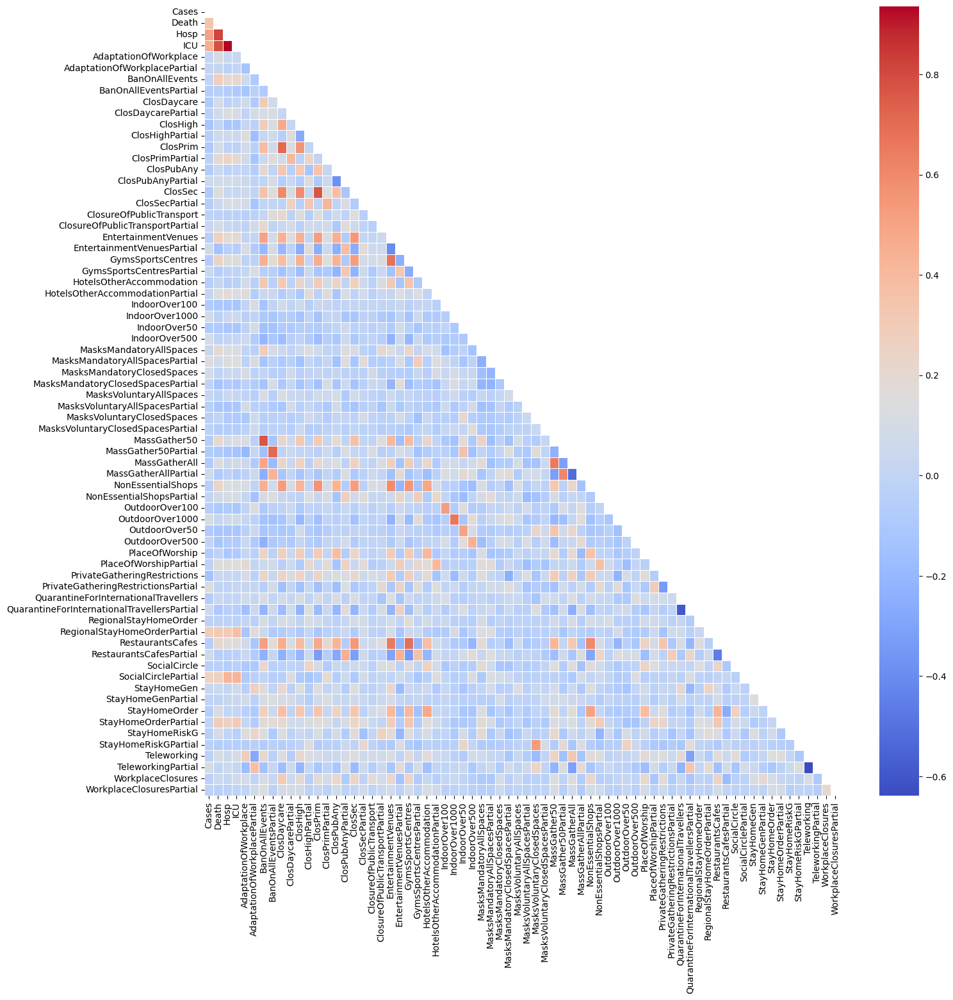

In [1410]:
europe_covid_measures = europe_covid_df[['Cases', 'Death', 'Hosp', 'ICU', 
'AdaptationOfWorkplace', 'AdaptationOfWorkplacePartial', 'BanOnAllEvents', 'BanOnAllEventsPartial', 'ClosDaycare', 
'ClosDaycarePartial', 'ClosHigh', 'ClosHighPartial', 'ClosPrim', 'ClosPrimPartial', 'ClosPubAny', 'ClosPubAnyPartial', 
'ClosSec', 'ClosSecPartial', 'ClosureOfPublicTransport', 'ClosureOfPublicTransportPartial', 'EntertainmentVenues', 
'EntertainmentVenuesPartial', 'GymsSportsCentres', 'GymsSportsCentresPartial', 'HotelsOtherAccommodation', 
'HotelsOtherAccommodationPartial', 'IndoorOver100', 'IndoorOver1000', 'IndoorOver50', 'IndoorOver500', 
'MasksMandatoryAllSpaces', 'MasksMandatoryAllSpacesPartial', 'MasksMandatoryClosedSpaces', 
'MasksMandatoryClosedSpacesPartial', 'MasksVoluntaryAllSpaces', 'MasksVoluntaryAllSpacesPartial', 
'MasksVoluntaryClosedSpaces', 'MasksVoluntaryClosedSpacesPartial', 'MassGather50', 'MassGather50Partial', 
'MassGatherAll', 'MassGatherAllPartial', 'NonEssentialShops', 'NonEssentialShopsPartial', 'OutdoorOver100', 
'OutdoorOver1000', 'OutdoorOver50', 'OutdoorOver500', 'PlaceOfWorship', 'PlaceOfWorshipPartial', 
'PrivateGatheringRestrictions', 'PrivateGatheringRestrictionsPartial', 'QuarantineForInternationalTravellers', 
'QuarantineForInternationalTravellersPartial', 'RegionalStayHomeOrder', 'RegionalStayHomeOrderPartial', 
'RestaurantsCafes', 'RestaurantsCafesPartial', 'SocialCircle', 'SocialCirclePartial', 'StayHomeGen', 
'StayHomeGenPartial', 'StayHomeOrder', 'StayHomeOrderPartial', 'StayHomeRiskG', 'StayHomeRiskGPartial', 
'Teleworking', 'TeleworkingPartial', 'WorkplaceClosures', 'WorkplaceClosuresPartial']]
fig, ax = plt.subplots(figsize=(16,16))
corr_matrix_measures = europe_covid_measures.corr()
sns.heatmap(corr_matrix_measures, annot=False, mask=np.triu(europe_covid_measures.corr()), cmap='coolwarm', linewidths=0.5, ax=ax) #
plt.show()

In [1412]:
best_measures = corr_matrix_measures['Cases'].loc[((corr_matrix_measures['Cases'] > 0.3) | (corr_matrix_measures['Cases'] < -0.3)) & (corr_matrix_measures['Cases'] != 1.0)]
print(best_measures)

Death    0.343284
Hosp     0.508183
ICU      0.450736
Name: Cases, dtype: float64


In [1413]:
best_measures = corr_matrix_measures['Death'].loc[((corr_matrix_measures['Death'] > 0.3) | (corr_matrix_measures['Death'] < -0.3)) & (corr_matrix_measures['Death'] != 1.0)]
print(best_measures)

Cases                           0.343284
Hosp                            0.816671
ICU                             0.787487
RegionalStayHomeOrderPartial    0.309872
Name: Death, dtype: float64


In [1414]:
best_measures = corr_matrix_measures['Hosp'].loc[((corr_matrix_measures['Hosp'] > 0.3) | (corr_matrix_measures['Hosp'] < -0.3)) & (corr_matrix_measures['Hosp'] != 1.0)]
print(best_measures)

Cases                           0.508183
Death                           0.816671
ICU                             0.935638
RegionalStayHomeOrderPartial    0.312881
SocialCirclePartial             0.424918
Name: Hosp, dtype: float64


In [1415]:
best_measures = corr_matrix_measures['ICU'].loc[((corr_matrix_measures['ICU'] > 0.3) | (corr_matrix_measures['ICU'] < -0.3)) & (corr_matrix_measures['ICU'] != 1.0)]
print(best_measures)

Cases                           0.450736
Death                           0.787487
Hosp                            0.935638
RegionalStayHomeOrderPartial    0.369258
SocialCirclePartial             0.428354
StayHomeOrderPartial            0.302965
Name: ICU, dtype: float64


Связь между мерами защиты немедецинского характера слабая (всего было применено 66 видов таких мер в исследуемых странах Европы), но наиболее коррелированы со смертностью оказались следующие меры защиты:
- RegionalStayHomeOrderPartial - региональные локдауны (самоизоляция на дому), с как минимум одним полностью закрытым регионом
- SocialCirclePartial - ограничение социальных контактов
- StayHomeOrderPartial - локдаун (самоизоляция на дому)

Проанализируем корреляция различных видов вакцин:

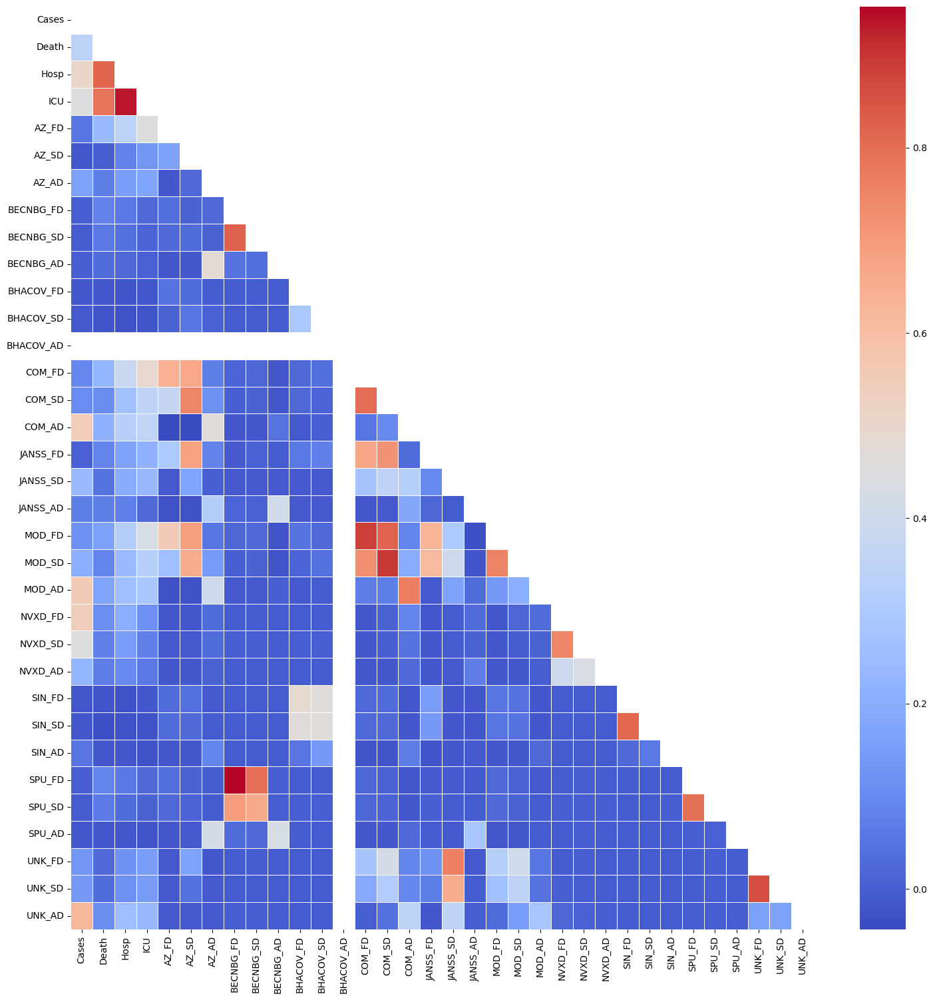

In [1416]:
europe_covid_vacciness = europe_covid_df[['Cases', 'Death', 'Hosp', 'ICU', 
'AZ_FD', 'AZ_SD', 'AZ_AD', 'BECNBG_FD', 'BECNBG_SD', 'BECNBG_AD', 'BHACOV_FD', 'BHACOV_SD', 'BHACOV_AD',
'COM_FD', 'COM_SD', 'COM_AD', 'JANSS_FD', 'JANSS_SD', 'JANSS_AD', 'MOD_FD', 'MOD_SD', 'MOD_AD',
'NVXD_FD', 'NVXD_SD', 'NVXD_AD', 'SIN_FD', 'SIN_SD', 'SIN_AD', 'SPU_FD', 'SPU_SD', 'SPU_AD', 'UNK_FD', 'UNK_SD', 'UNK_AD']]
fig, ax = plt.subplots(figsize=(18,18))
corr_matrix_vaccines = europe_covid_vacciness.corr()
sns.heatmap(corr_matrix_vaccines, annot=False, mask=np.triu(corr_matrix_vaccines.corr()), cmap='coolwarm', linewidths=0.5, ax=ax) #
plt.show()

Из тепловой карты видно, что сильно коррелированы данные о первой дозе вакцины со второй дозой, кроме вакцин AZ (Vaxzevria – AstraZeneca), BHACOV (Covaxin – Bharat) и JANSS (Ad26.COV 2.5 – Janssen)

Корреляция случаев заболевания:

In [1417]:
best_vaccines = corr_matrix_vaccines['Cases'].loc[((corr_matrix_vaccines['Cases'] > 0.3) | (corr_matrix_vaccines['Cases'] < -0.3)) & (corr_matrix_vaccines['Cases'] != 1.0)]
print(best_vaccines)

Death      0.343284
Hosp       0.508183
ICU        0.450736
COM_AD     0.544179
MOD_AD     0.556326
NVXD_FD    0.540194
NVXD_SD    0.450615
UNK_AD     0.624173
Name: Cases, dtype: float64


Корреляция госпитализированных пациентов:

In [1418]:
best_vaccines = corr_matrix_vaccines['Hosp'].loc[((corr_matrix_vaccines['Hosp'] > 0.3) | (corr_matrix_vaccines['Hosp'] < -0.3)) & (corr_matrix_vaccines['Hosp'] != 1.0)]
print(best_vaccines)

Cases     0.508183
Death     0.816671
ICU       0.935638
AZ_FD     0.342806
COM_FD    0.379566
COM_AD    0.328501
MOD_FD    0.316233
Name: Hosp, dtype: float64


Корреляция реанимированных пациентов:

In [1419]:
best_vaccines = corr_matrix_vaccines['ICU'].loc[((corr_matrix_vaccines['ICU'] > 0.3) | (corr_matrix_vaccines['ICU'] < -0.3)) & (corr_matrix_vaccines['ICU'] != 1.0)]
print(best_vaccines)

Cases     0.450736
Death     0.787487
Hosp      0.935638
AZ_FD     0.452850
COM_FD    0.495378
COM_SD    0.352922
COM_AD    0.356060
MOD_FD    0.428577
MOD_SD    0.328710
Name: ICU, dtype: float64


Наиболее коррелированными с выявленными случаями COVID-19 оказались вакцина NVXD (Novavax – Nuvaxovid) и дополнительные дозы вакцин COM (Comirnaty – Pfizer/BioNTech), MOD (mRNA-1273 – Moderna) и UNK (Неизвестная вакцина). 
Наиболее коррелированы с госпитализациями и реанимациями оказались вакцины - COM (Comirnaty – Pfizer/BioNTech), AZ (Vaxzevria – AstraZeneca) и MOD (mRNA-1273 – Moderna) и  - самыми широко примененными вакинами в Европе 76,59%, 11,64% и 9,78% от общего числа вакцинации соответственно.
  
  Не исключено, что сама вакцина вызывала заболевание COVID-19.

In [1420]:
sns.set_palette(sns.color_palette('flare', 30))

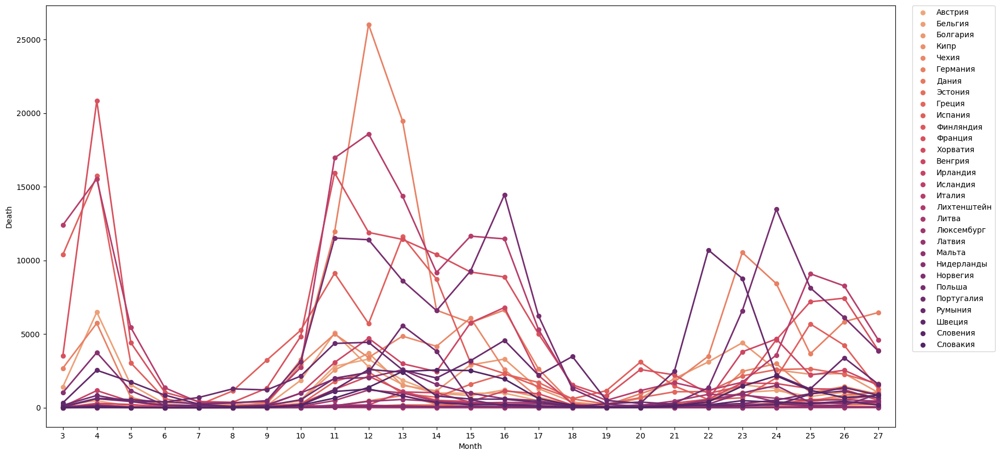

In [1421]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='Death', x='Month', data=europe_covid_df, hue='NAME', scale = 0.75);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

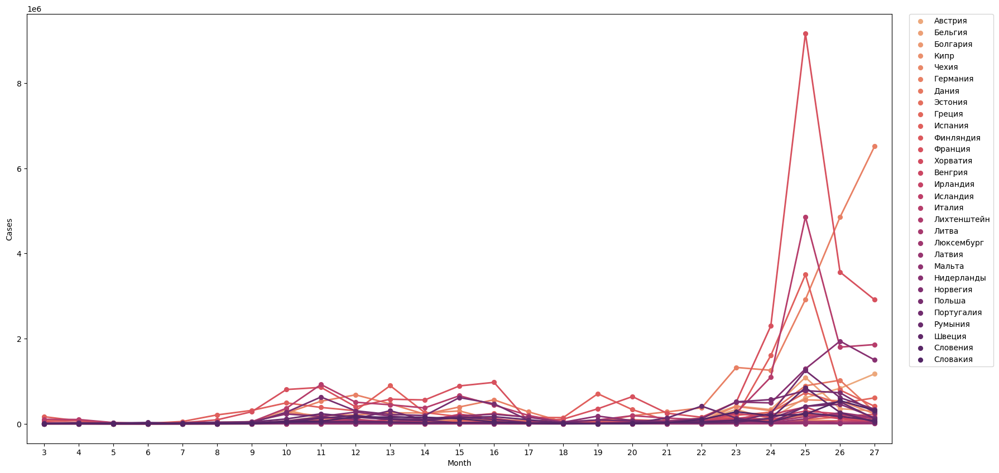

In [1422]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='Cases', x='Month', data=europe_covid_df, hue='NAME', scale = 0.75);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

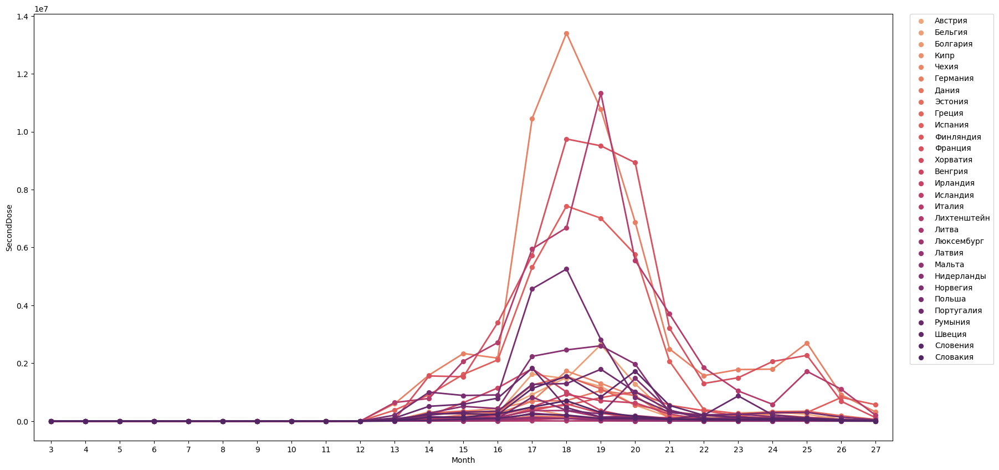

In [1423]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='SecondDose', x='Month', data=europe_covid_df, hue='NAME', scale = 0.75);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

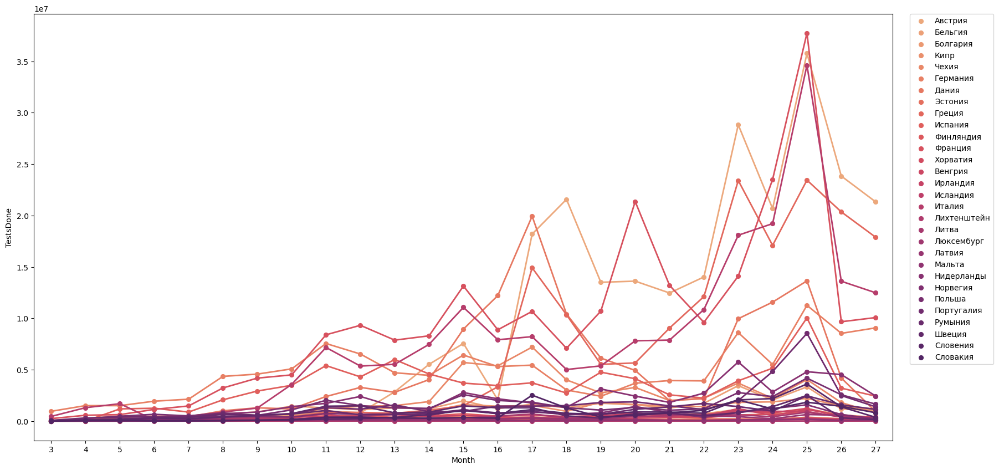

In [1424]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='TestsDone', x='Month', data=europe_covid_df, hue='NAME', scale = 0.75);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

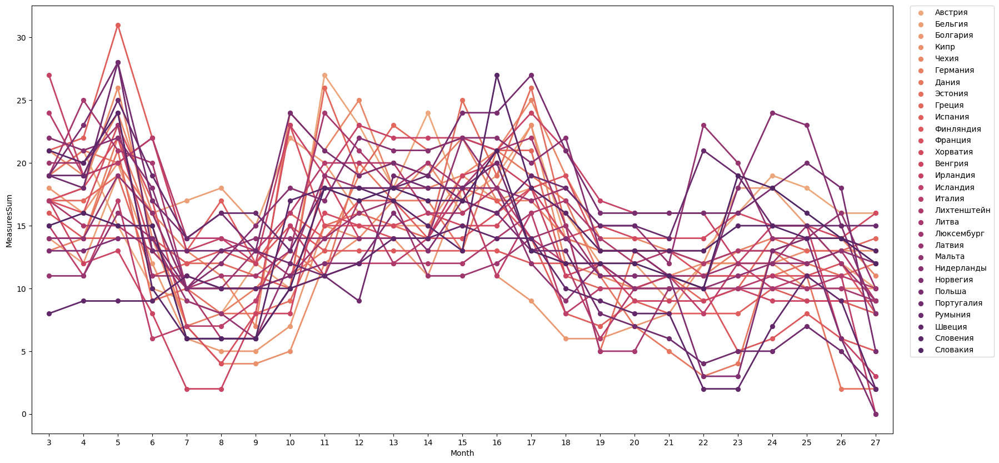

In [1425]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='MeasuresSum', x='Month', data=europe_covid_df, hue='NAME', scale = 0.75);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

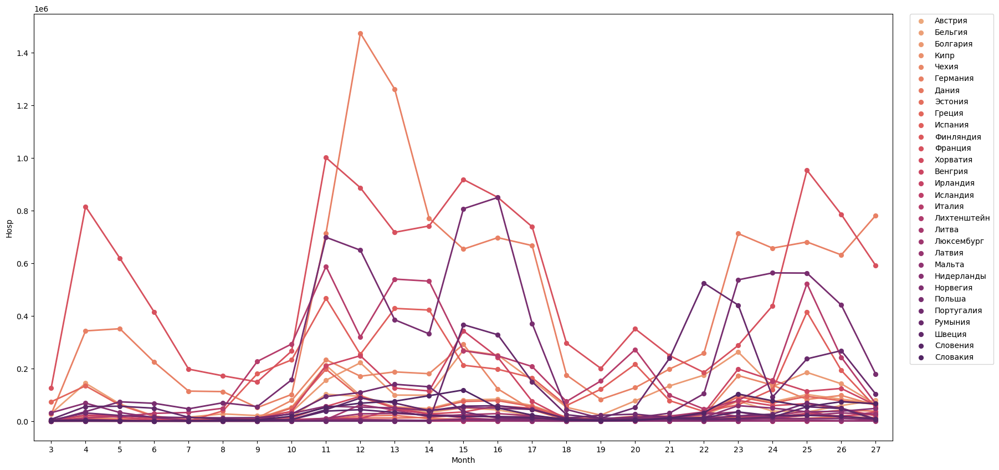

In [1426]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='Hosp', x='Month', data=europe_covid_df, hue='NAME', scale = 0.75);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

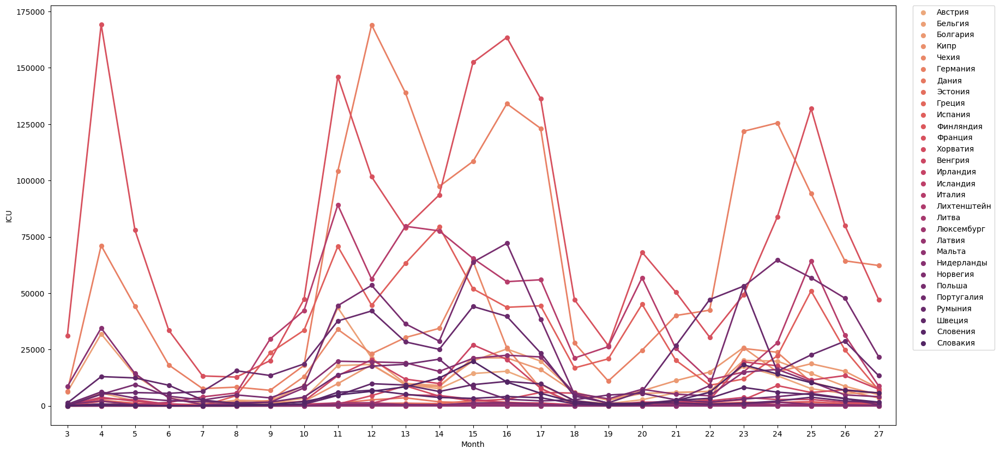

In [1427]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='ICU', x='Month', data=europe_covid_df, hue='NAME', scale = 0.75);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

Далее проанализируем ограничительные меры, принятые в разных странах в каждый месяц:

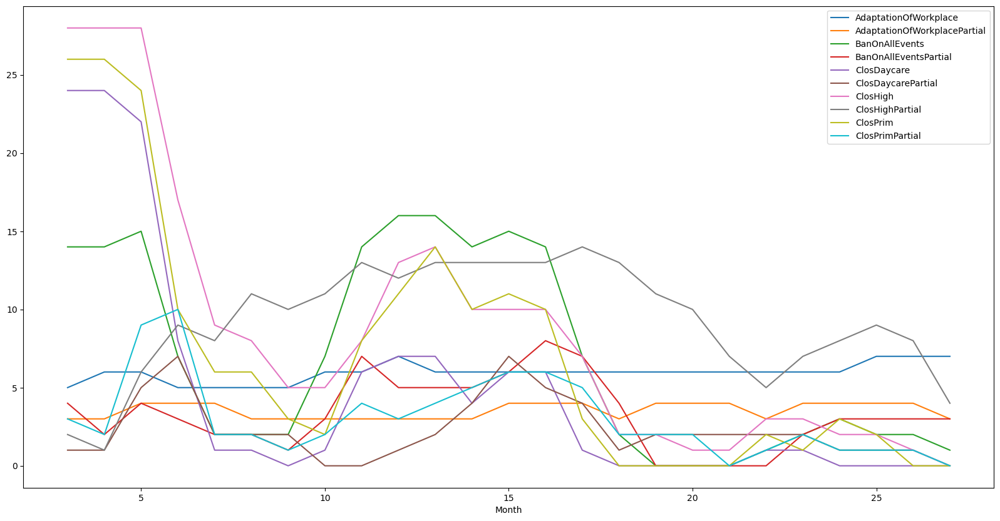

In [1428]:
measure_list_1 = []
for column in europe_covid_df.columns.to_list()[9:19]:  #[8:74]
    measure_series = europe_covid_df.groupby('Month').sum()[column]
    measure_series.name = column
    measure_list_1.append(measure_series)
measure_covid_df = pd.concat(measure_list_1,axis=1)
sns.set_palette(sns.color_palette('tab10', 11))
measure_covid_df.plot(kind='line');

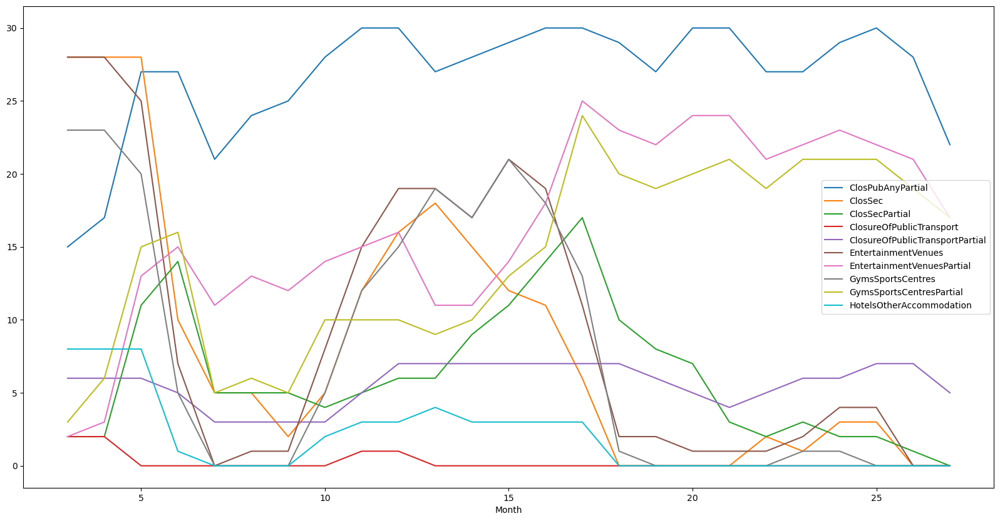

In [1429]:
measure_list_1 = []
for column in europe_covid_df.columns.to_list()[20:30]:  #[8:74]
    measure_series = europe_covid_df.groupby('Month').sum()[column]
    measure_series.name = column
    measure_list_1.append(measure_series)
measure_covid_df = pd.concat(measure_list_1,axis=1)
sns.set_palette(sns.color_palette('tab10', 11))
measure_covid_df.plot(kind='line');

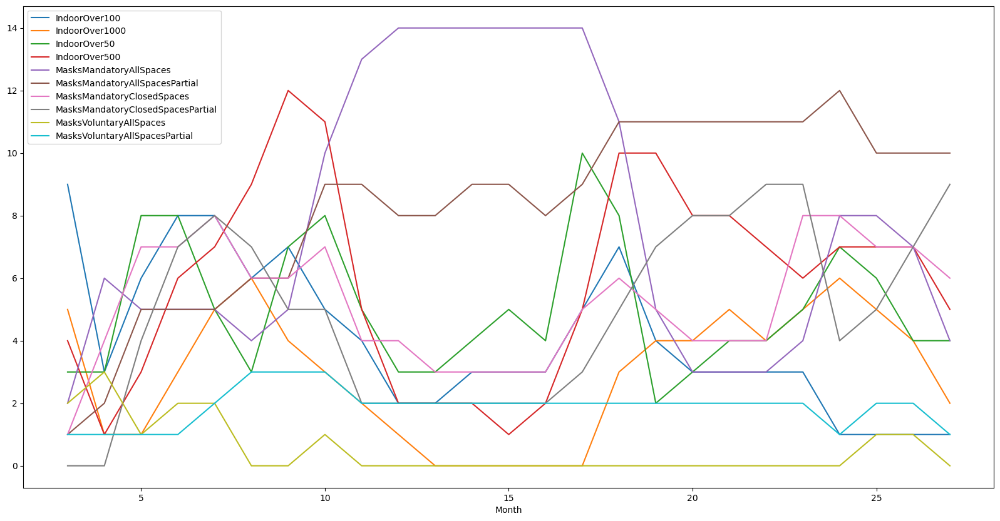

In [1430]:
measure_list_1 = []
for column in europe_covid_df.columns.to_list()[31:41]:  #[8:74]
    measure_series = europe_covid_df.groupby('Month').sum()[column]
    measure_series.name = column
    measure_list_1.append(measure_series)
measure_covid_df = pd.concat(measure_list_1,axis=1)
sns.set_palette(sns.color_palette('tab10', 11))
measure_covid_df.plot(kind='line');

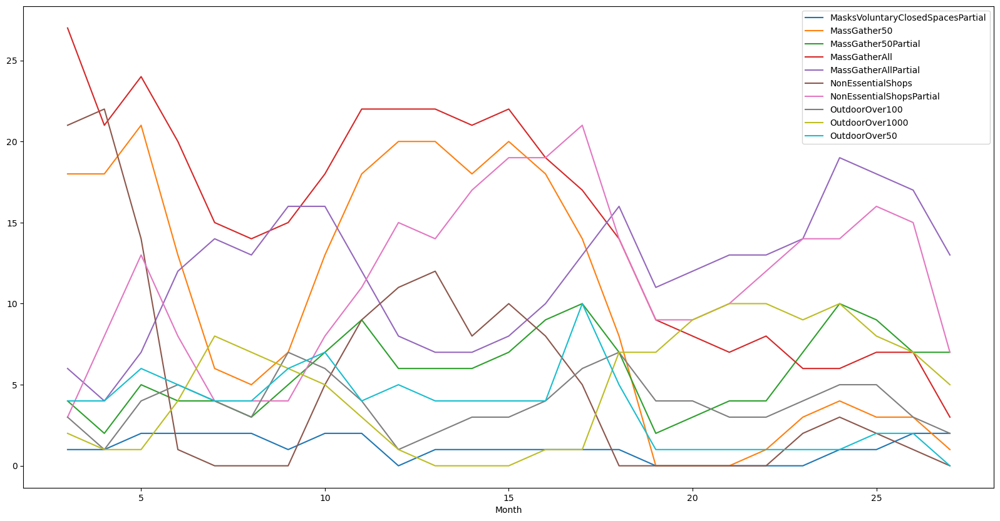

In [1431]:
measure_list_1 = []
for column in europe_covid_df.columns.to_list()[42:52]:  #[8:74]
    measure_series = europe_covid_df.groupby('Month').sum()[column]
    measure_series.name = column
    measure_list_1.append(measure_series)
measure_covid_df = pd.concat(measure_list_1,axis=1)
sns.set_palette(sns.color_palette('tab10', 11))
measure_covid_df.plot(kind='line');

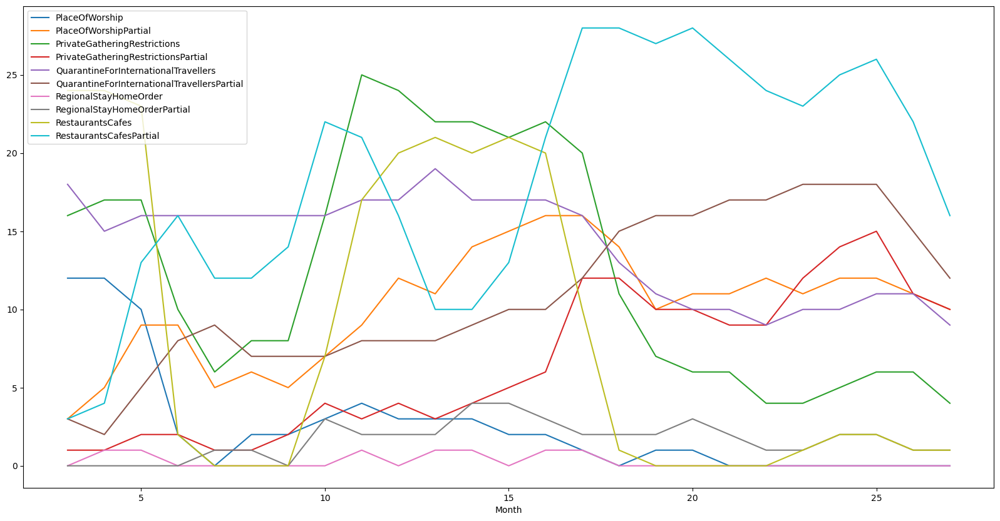

In [1432]:
measure_list_1 = []
for column in europe_covid_df.columns.to_list()[53:63]:  #[8:74]
    measure_series = europe_covid_df.groupby('Month').sum()[column]
    measure_series.name = column
    measure_list_1.append(measure_series)
measure_covid_df = pd.concat(measure_list_1,axis=1)
sns.set_palette(sns.color_palette('tab10', 11))
measure_covid_df.plot(kind='line');

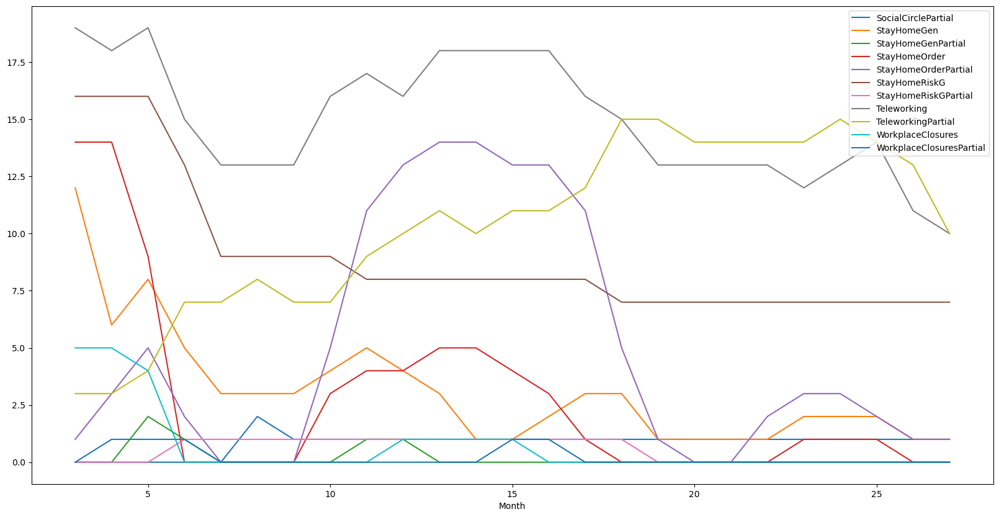

In [1433]:
measure_list_1 = []
for column in europe_covid_df.columns.to_list()[64:75]:  #[8:74]
    measure_series = europe_covid_df.groupby('Month').sum()[column]
    measure_series.name = column
    measure_list_1.append(measure_series)
measure_covid_df = pd.concat(measure_list_1,axis=1)
sns.set_palette(sns.color_palette('tab10', 11))
measure_covid_df.plot(kind='line');

Визуализация количества примененных вакцин по их типам:

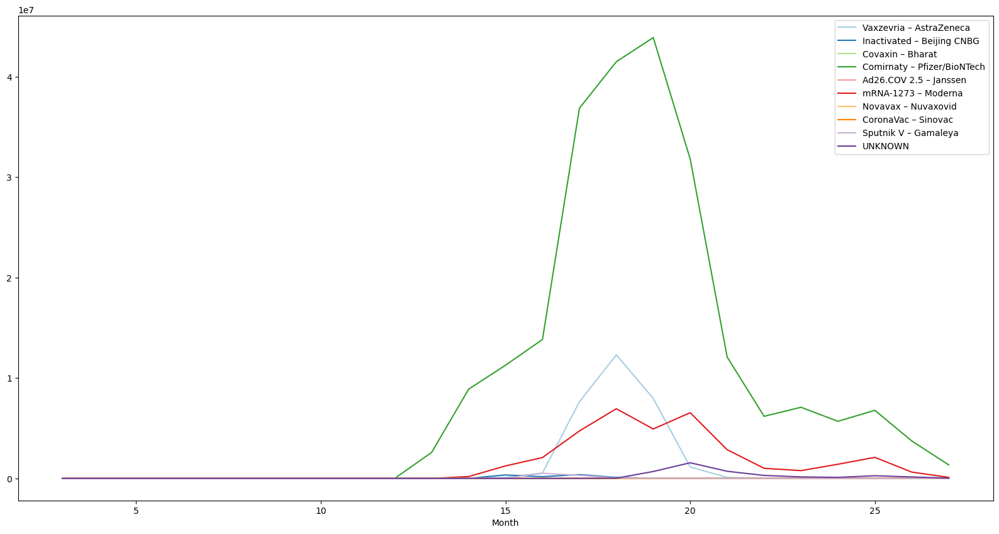

In [1434]:
vacc_lst = []
for column in [lst for lst in europe_covid_df.columns.to_list() if lst.endswith('_SD')]:
    vacc_series = europe_covid_df.groupby('Month').sum()[column]
    vac_dict = {'AZ_SD': 'Vaxzevria – AstraZeneca',
           'BECNBG_SD': 'Inactivated – Beijing CNBG',
           'BHACOV_SD': 'Covaxin – Bharat',
           'COM_SD': 'Comirnaty – Pfizer/BioNTech',
           'JANSS_SD': 'Ad26.COV 2.5 – Janssen',
           'MOD_SD': 'mRNA-1273 – Moderna',
           'NVXD_SD': 'Novavax – Nuvaxovid',
           'SIN_SD': 'CoronaVac – Sinovac',
           'SPU_SD': 'Sputnik V – Gamaleya',
           'UNK_SD': 'UNKNOWN'}
    vacc_series.name = vac_dict[column]
    vacc_lst.append(vacc_series)
vaccine_covid_df = pd.concat(vacc_lst,axis=1)
sns.set_palette(sns.color_palette('Paired', 10))
vaccine_covid_df.plot(kind='line');

БОльшая часть стран проводила вакцинацию препаратами Vaxzevria, Comirnaty и mRNA-1273:

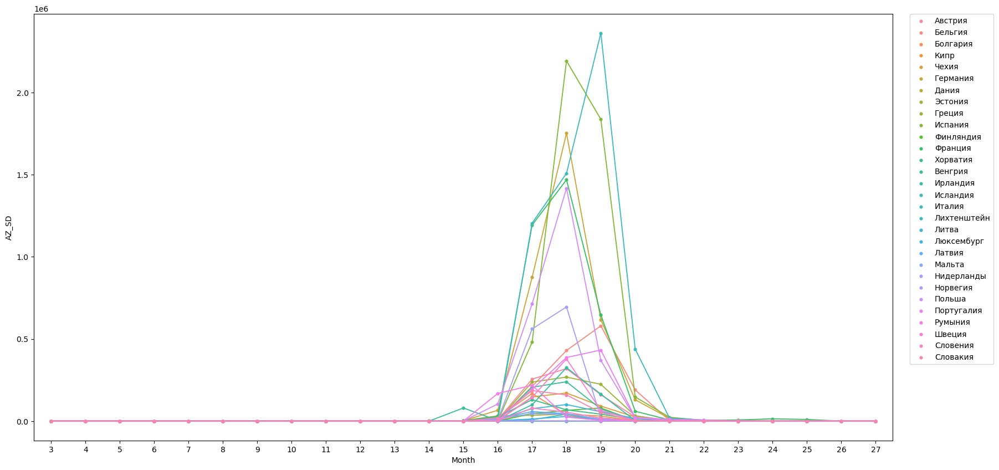

In [1435]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='AZ_SD', x='Month', data=europe_covid_df, hue='NAME', scale = 0.5);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

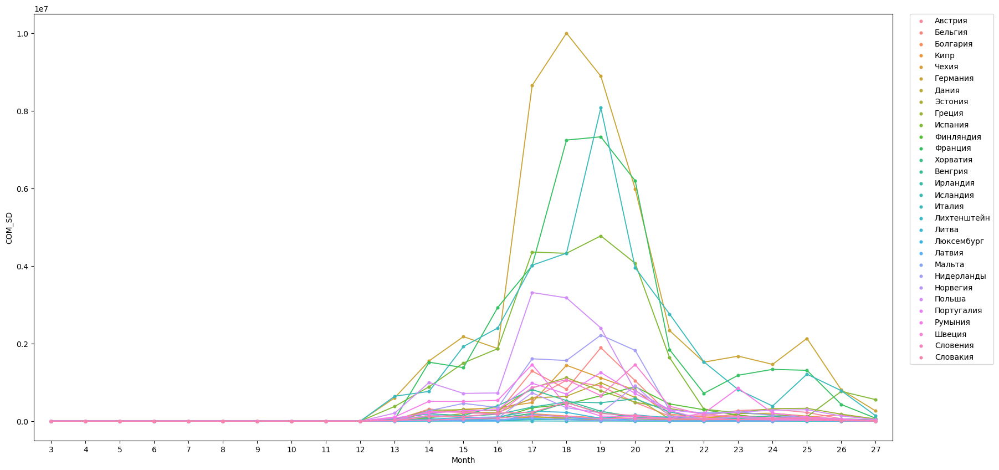

In [1436]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='COM_SD', x='Month', data=europe_covid_df, hue='NAME', scale = 0.5);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

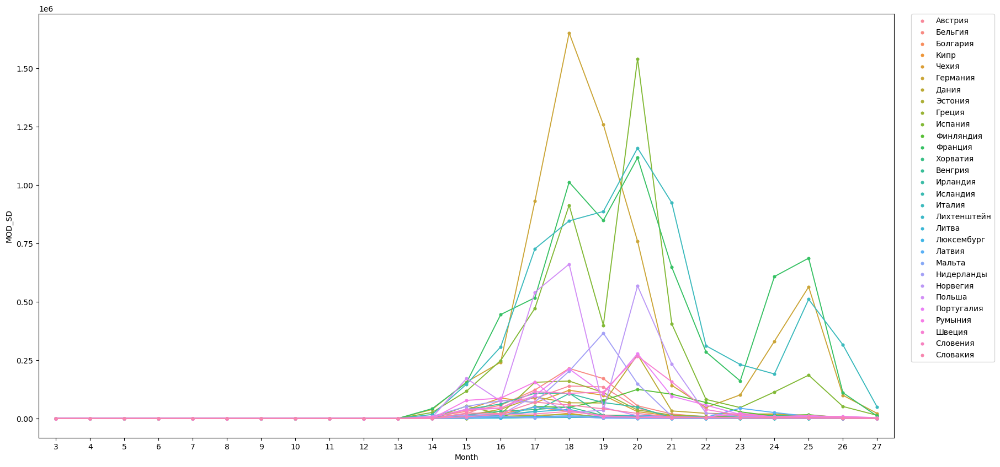

In [1437]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='MOD_SD', x='Month', data=europe_covid_df, hue='NAME', scale = 0.5);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

Вакцинация препаратом Inactivated – Beijing CNBG в Венгрии: 

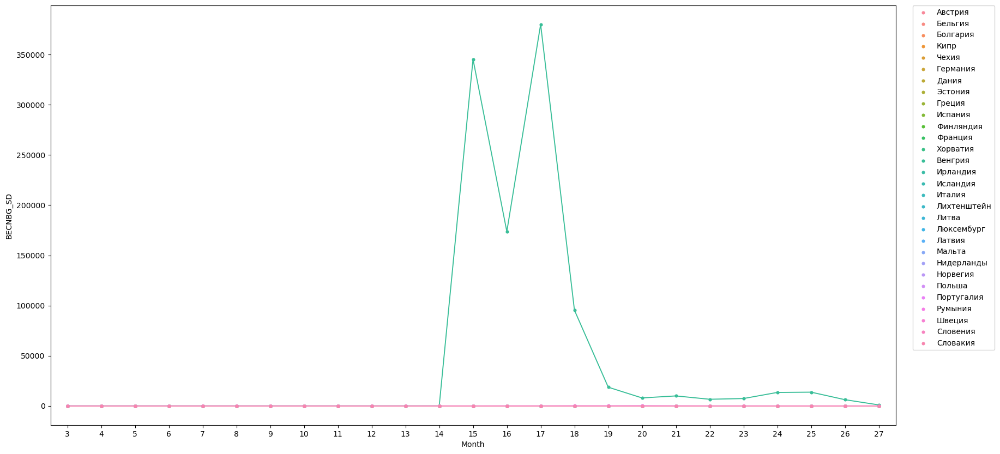

In [1438]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='BECNBG_SD', x='Month', data=europe_covid_df, hue='NAME', scale = 0.5);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

Единичные случаи вакцинации препаратом Covaxin в Португалии:

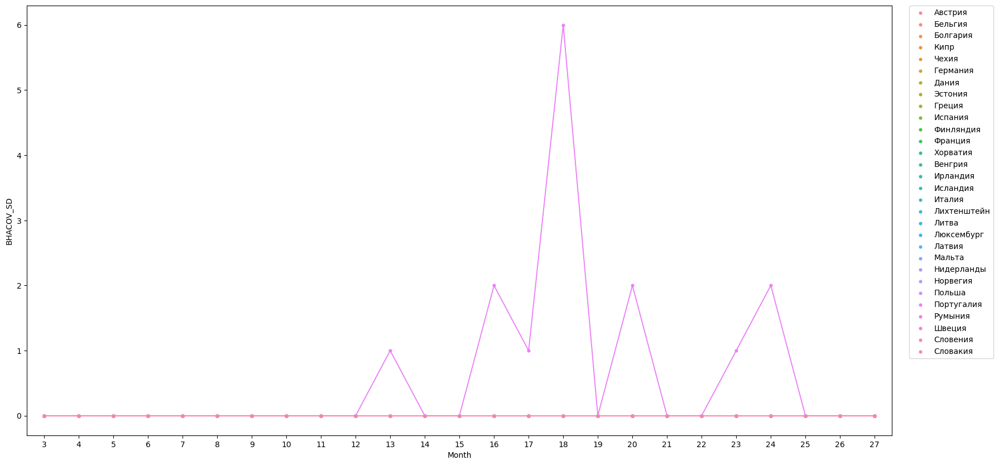

In [1439]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='BHACOV_SD', x='Month', data=europe_covid_df, hue='NAME', scale = 0.5);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

Португалия, Австрия, Дания, Чехия, Австрия, Испания проводили вакцинаци небольшим количеством препарата Ad26.COV 2.5:

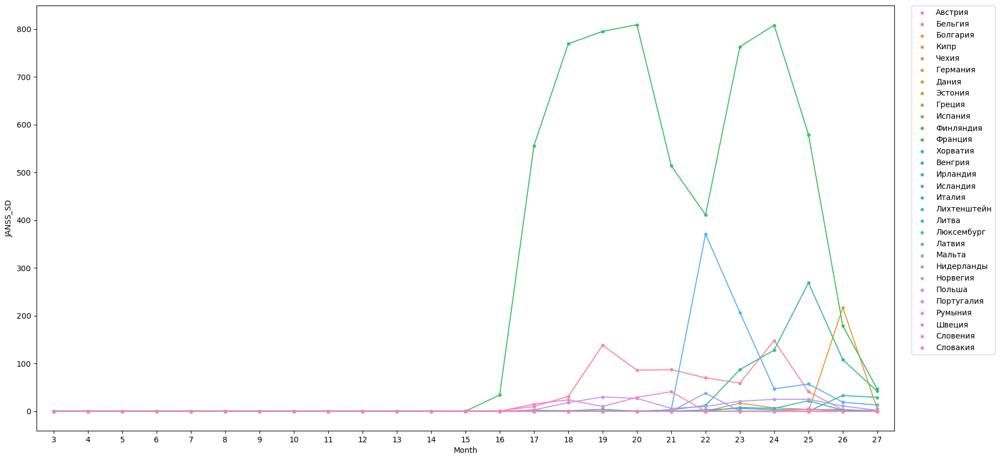

In [1440]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='JANSS_SD', x='Month', data=europe_covid_df, hue='NAME', scale = 0.5);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

В этом году Австрия, Греция, Германия, Чехия, Франция, Италия, Люксембург, Латвия, Словакия, Словения, Швеция, Польша начали вакцинацию препаратом Novavax.

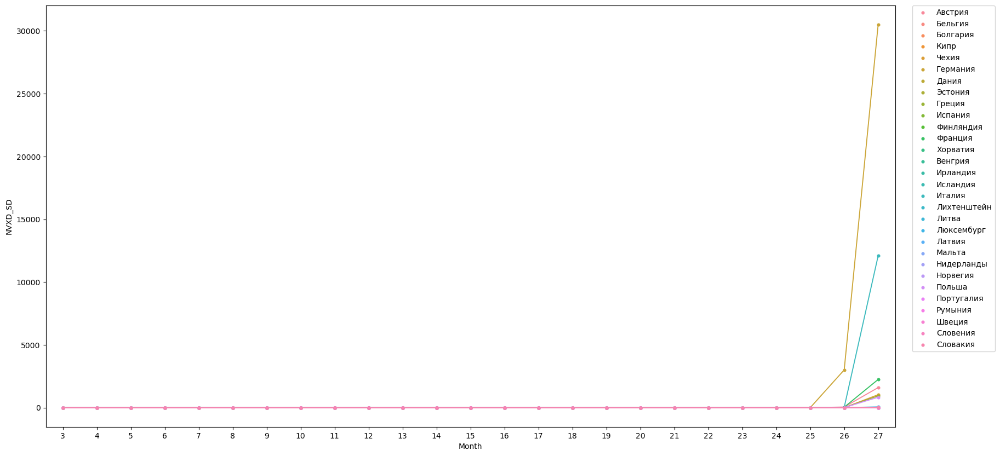

In [1441]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='NVXD_SD', x='Month', data=europe_covid_df, hue='NAME', scale = 0.5);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

Немного случаев вакцинации препаратом CoronaVac проведено в Португалии:

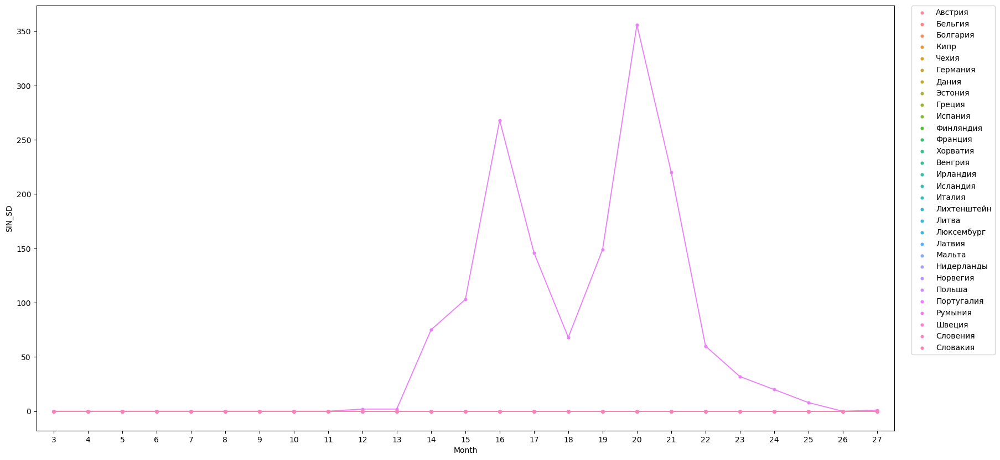

In [1442]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='SIN_SD', x='Month', data=europe_covid_df, hue='NAME', scale = 0.5);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

БОльшую часть вакцины Спутник-V применили в Венгрии, немного случаев вакцинации проведено в Словакии:

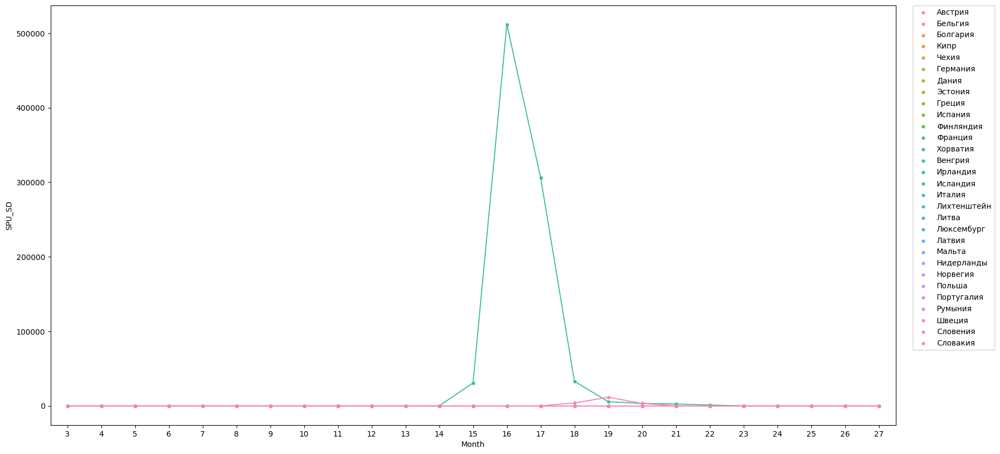

In [1443]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='SPU_SD', x='Month', data=europe_covid_df, hue='NAME', scale = 0.5);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

Некий неизвестный тип вакцины характерен только для Франции:

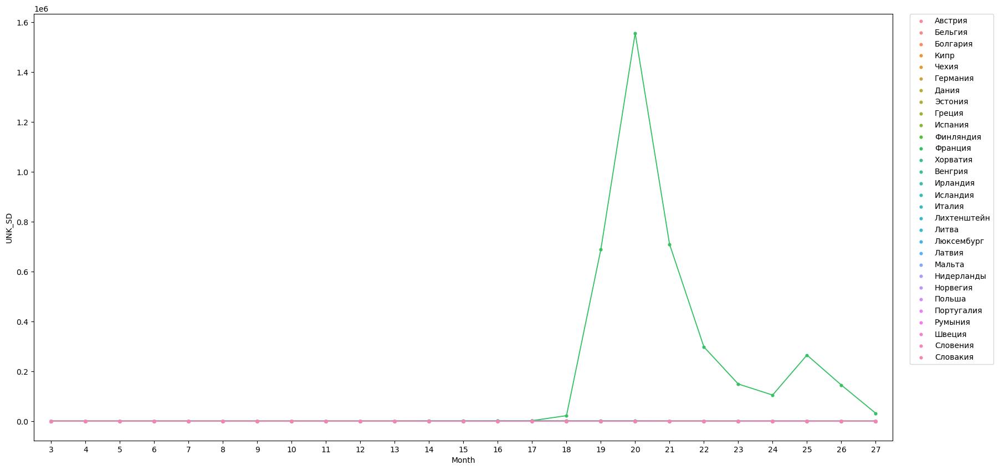

In [1444]:
plt.rcParams['figure.figsize'] = (20, 10)
sns.pointplot(y='UNK_SD', x='Month', data=europe_covid_df, hue='NAME', scale = 0.5);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

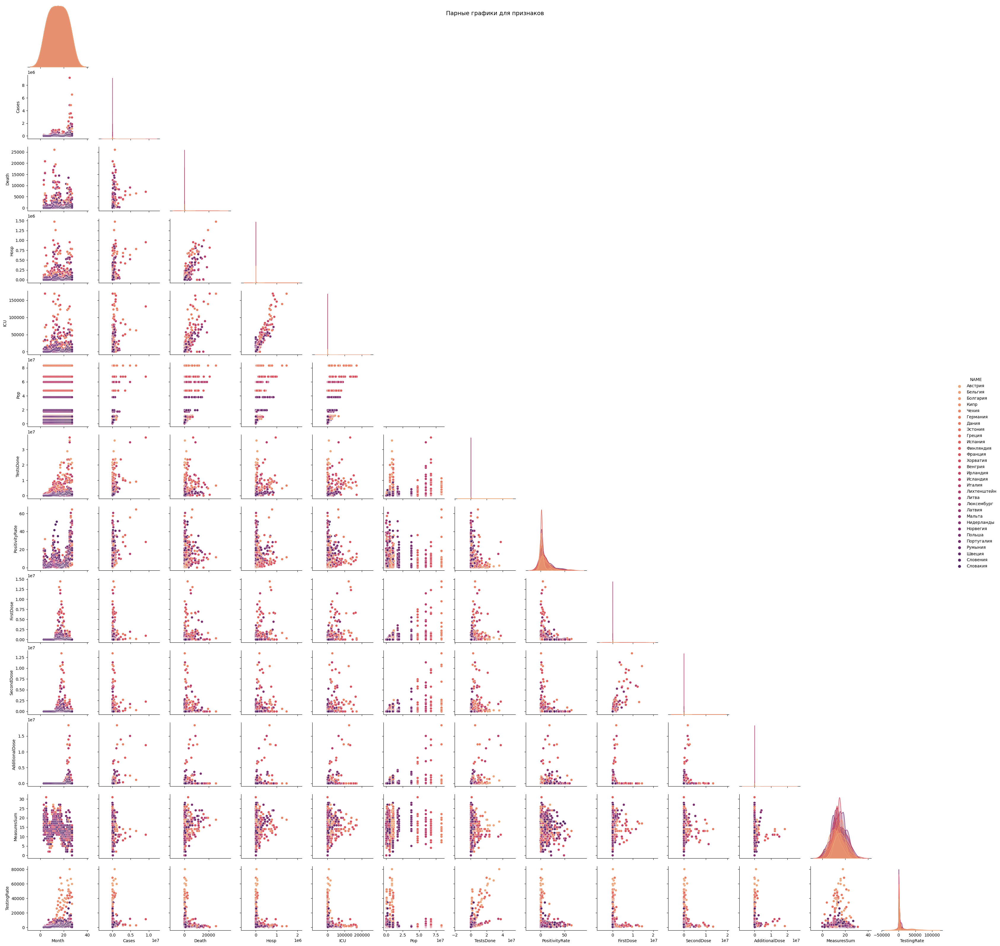

In [1445]:
sns.set_palette(sns.color_palette('flare', 30))
sns.pairplot(data=europe_covid_df_model, hue='NAME', corner=True).fig.suptitle('Парные графики для признаков', fontsize = 14);

# pp = sns.pairplot(data=europe_covid_df_model,
#                   y_vars=['Death'],
#                   x_vars=['Cases', 'TestsDone', 'TestingRate', 
#                                          'PositivityRate', 'FirstDose', 'SecondDose', 'AdditionalDose', 'Hosp',
#                                          'ICU', 'MeasuresSum'], hue='ISO3')
# pp.fig.set_size_inches(15,15)


In [1405]:
#europe_covid_df_model = dataset_prepare_model(europe_covid_df)

In [1447]:
y, X = dmatrices('Death ~ Month+Cases+Hosp+ICU+Pop+TestsDone+PositivityRate+FirstDose+SecondDose+AdditionalDose+MeasuresSum+TestingRate', data=europe_covid_df_model, return_type='dataframe')
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['variable'] = X.columns
print(vif)


          VIF        variable
0   20.366162       Intercept
1    1.803309           Month
2    2.614518           Cases
3   10.119434            Hosp
4   11.441758             ICU
5    2.791700             Pop
6    4.342090       TestsDone
7    1.612572  PositivityRate
8    3.850083       FirstDose
9    3.377623      SecondDose
10   1.891385  AdditionalDose
11   1.195437     MeasuresSum
12   2.977229     TestingRate


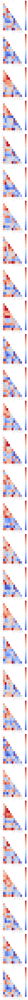

In [1450]:
fig, axes = plt.subplots(nrows=30, ncols=1, figsize=(12, 400))
axes = axes.ravel()
for country_index, ax in enumerate(axes):
    ax.figure
    country_df = europe_covid_df_model.loc[europe_covid_df_model['ISO3'] == country_list[country_index]].drop('Pop', axis=1)
    sns.heatmap(country_df.corr(), annot=True, mask=np.triu(country_df.corr()), cmap='coolwarm', linewidths=0.5, ax=ax)
    ax.set_title(country_list[country_index])
plt.tight_layout()
plt.show()

In [1451]:
feature_names = []
def dataset_prepare(dataset):
    categorical_features = dataset.select_dtypes(include=['object'])
    categorical_features_processed = pd.get_dummies(categorical_features)
    numerical_features =  dataset.select_dtypes(exclude=['object'])
    combined_df = pd.concat([numerical_features, categorical_features_processed], axis=1)
    x = combined_df.drop(['Death'], axis=1)
    global feature_names
    feature_names = x.columns.values.tolist()
    y = combined_df['Death']
    scaler = StandardScaler() ##  RobustScaler  StandardScaler
    scaler = scaler.fit(x)
    x_normalized = scaler.transform(x)
    return train_test_split(x_normalized, y, test_size=0.1, random_state=1)


def dataset_prepare_all(dataset):
    categorical_features = dataset.select_dtypes(include=['object'])
    categorical_features_processed = pd.get_dummies(categorical_features)
    numerical_features =  dataset.select_dtypes(exclude=['object'])
    combined_df = pd.concat([numerical_features, categorical_features_processed], axis=1)
    x = combined_df.drop(['Death'], axis=1)
    y = combined_df['Death']
    scaler = StandardScaler() ##  RobustScaler  StandardScaler
    scaler = scaler.fit(x)
    x_normalized = scaler.transform(x)
    return x_normalized, y

In [1452]:
def model_scorer(model, xtr, ytr, xtst, ytst):
    model.fit(xtr, ytr)
    predict = model.predict(xtst)
    mae = metrics.mean_absolute_error(ytst, predict)
    mse = metrics.mean_squared_error(ytst, predict)
    rmse = np.sqrt(metrics.mean_squared_error(ytst, predict))
    r2 = metrics.r2_score(ytst, predict)

    print(f'   MAE: {mae}')
    print(f'   MSE: {mse}')
    print(f'   RMSE: {rmse}')
    print(f'   R2: {r2}')
    print(f' ')

In [1453]:
europe_covid_df_model = dataset_prepare_model(europe_covid_df)

if 'NAME' in europe_covid_df_model.columns:
    europe_covid_df_model = europe_covid_df_model.drop(['NAME'], axis=1)

x_train, x_test, y_train, y_test = dataset_prepare(europe_covid_df_model)

print('Метрики LinearRegression:')
lin_reg = LinearRegression()
model_scorer(lin_reg, x_train, y_train, x_test, y_test)

print('Метрики RidgeCV:')
ridge = RidgeCV(alphas=[0.001,0.01,1,10])
model_scorer(ridge, x_train, y_train, x_test, y_test)

print('Метрики LassoCV:')
alphavec = 10**np.linspace(-2,2,200)
lasso = LassoCV(alphas = alphavec, cv=5, tol=10)
model_scorer(lasso, x_train, y_train, x_test, y_test)

print('Метрики ElasticNetCV:')
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
ratios = np.arange(0, 1, 0.01)
alphas = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.0, 1.0, 10.0, 100.0]
elastic = ElasticNetCV(l1_ratio=ratios, alphas=alphas, cv=cv, n_jobs=-1)
model_scorer(lin_reg, x_train, y_train, x_test, y_test)

print('Метрики XGBoost:')
xgb_r = xgb.XGBRegressor(objective ='reg:squarederror', n_estimators = 1000, max_depth = 4, seed = 42)
model_scorer(xgb_r, x_train, y_train, x_test, y_test)

print('Метрики SVR:') 
svr_r = SVR(kernel = 'linear', C=1e3)
model_scorer(svr_r, x_train, y_train, x_test, y_test)

C:\Users\r.purey\AppData\Local\Temp\ipykernel_9292\1324819076.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return_model['Vaccine_Mortality'] = 'W'


       NAME ISO3  Cases  Death   Hosp   ICU       Pop  TestsDone  FirstDose  \
0   Австрия  AUT  10478    174      0     0   8901064        0.0          0   
1   Бельгия  BEL  16977   1411  28957  6171  11522440    58619.0          0   
2  Болгария  BGR    412      8      0     0   6951482        0.0          0   
3      Кипр  CYP    147      2     21     6    888005      689.0          0   
4     Чехия  CZE   3316     35   1856   340  10693939    44082.0          0   

   SecondDose Vaccine_Mortality  
0           0                 W  
1           0                 W  
2           0                 E  
3           0                 W  
4           0                 W  
Метрики LinearRegression:
   MAE: 461.1526625000001
   MSE: 803648.2004288323
   RMSE: 896.4642772742438
   R2: 0.8661194309709964
 
Метрики RidgeCV:
   MAE: 466.93117471899245
   MSE: 838818.2147100763
   RMSE: 915.870195338879
   R2: 0.8602604226110965
 
Метрики LassoCV:
   MAE: 813.3486101717874
   MSE: 6218945.13174

In [1454]:
predict_df = pd.read_csv('to_predict.csv', sep=';')
predict_df_model = dataset_prepare_model(predict_df)

  ISO3   Cases  Death   Hosp   ICU       Pop  TestsDone  FirstDose  \
0  AUT  294593    682  50971  4303   8901064    7819977       3798   
1  BEL  204221    620  80192  4707  11522440     663603       2406   
2  BGR   17806    399  31203  3520   6951482     225701       3108   
3  CYP   49656     61    562    36    888005     675355        988   
4  CZE   83350    452  32672  1832  10693939     447038       3297   

   SecondDose Vaccine_Mortality  
0        9494                 W  
1        3680                 W  
2        2167                 E  
3         764                 W  
4        5249                 W  


C:\Users\r.purey\AppData\Local\Temp\ipykernel_9292\1324819076.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return_model['Vaccine_Mortality'] = 'W'


In [1455]:
svr_r = SVR(kernel='rbf', C=1200, gamma=0.12)
X, y = dataset_prepare_all(europe_covid_df_model)
svr_r.fit(X, y)

X_predict, Y_predict = dataset_prepare_all(predict_df_model)
predict_result = svr_r.predict(X_predict)

mae = metrics.mean_absolute_error(Y_predict, predict_result)
mse = metrics.mean_squared_error(Y_predict, predict_result)
rmse = np.sqrt(metrics.mean_squared_error(Y_predict, predict_result))
r2 = metrics.r2_score(Y_predict, predict_result)

print(f'   MAE: {mae}')
print(f'   MSE: {mse}')
print(f'   RMSE: {rmse}')
print(f'   R2: {r2}')
print(f' ')

   MAE: 237.0705590816114
   MSE: 143407.61316844312
   RMSE: 378.6919766359503
   R2: 0.8514161145425587
 


In [1456]:
def print_predict(test, predict):
    for ind in range(0, 30):
        if test[ind] != 0:
            print(f'Страна: {country_list[ind]} факт: {test[ind]}\t\t  прогноз: {round(predict[ind])}')
        else:
            print(f'Страна: {country_list[ind]} факт: {test[ind]}\t\t  прогноз: {round(predict[ind])}')

In [1457]:
print_predict(Y_predict, predict)

Страна: AUT факт: 682		  прогноз: 753
Страна: BEL факт: 620		  прогноз: 1146
Страна: BGR факт: 399		  прогноз: 670
Страна: CYP факт: 61		  прогноз: 20
Страна: CZE факт: 452		  прогноз: 629
Страна: DEU факт: 2182		  прогноз: 2652
Страна: DNK факт: 460		  прогноз: 151
Страна: ESP факт: 80		  прогноз: 66
Страна: EST факт: 1575		  прогноз: 1485
Страна: FIN факт: 1537		  прогноз: 1457
Страна: FRA факт: 234		  прогноз: 141
Страна: GRC факт: 3657		  прогноз: 3808
Страна: HRV факт: 265		  прогноз: 441
Страна: HUN факт: 731		  прогноз: 870
Страна: IRL факт: 334		  прогноз: 210
Страна: ISL факт: 18		  прогноз: 28
Страна: ITA факт: 4124		  прогноз: 2764
Страна: LIE факт: 0		  прогноз: 33
Страна: LTU факт: 209		  прогноз: 294
Страна: LUX факт: 30		  прогноз: 74
Страна: LVA факт: 164		  прогноз: 124
Страна: MLT факт: 60		  прогноз: 43
Страна: NLD факт: 268		  прогноз: 690
Страна: NOR факт: 414		  прогноз: 97
Страна: POL факт: 886		  прогноз: 283
Страна: PRT факт: 586		  прогноз: 427
Страна: ROU фак

In [1460]:
predict_rounded = []
for pr in predict:
    predict_rounded.append(round(pr))
dct = {'country': country_list, 'fact':Y_predict,'predict':predict_rounded}
result_df = pd.DataFrame(dct)

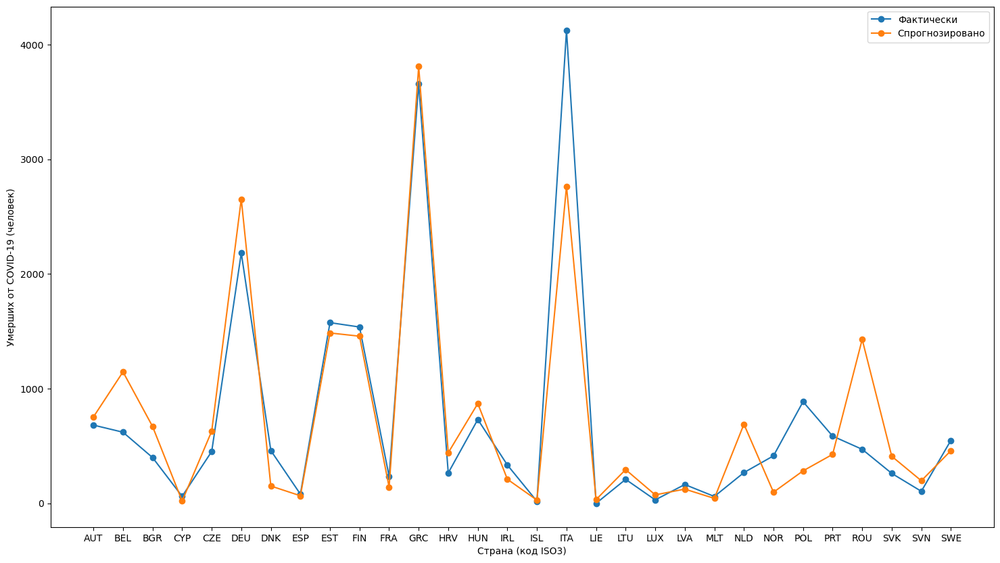

In [1459]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

result_df.plot(x='country', xlabel='Страна (код ISO3)', ylabel='Умерших от COVID-19 (человек)', 
               figsize=(18,10), xticks=range(0,30), marker='o');
plt.legend(['Фактически', 'Спрогнозировано']);

 - Работа русских ученых по предсказанию заражений и смертности в регионах РФ:
https://www.pharmacoeconomics.ru/jour/article/view/541
 - Работа иностранных ученых по предсказанию новых случаев заражения и тестирования:
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7723767/